<ipython-input-4-3765902213>:8: DtypeWarning: Columns (9) have mixed types. Specify dtype option on import or set low_memory=False.
  data = pd.read_csv('/content/hospital_datas.csv')  # Load hospital dataset from a CSV file into a DataFrame
<ipython-input-4-3765902213>:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='ward', y='length_of_stay', data=avg_stay, palette='Blues_d')  # Create bar plot of avg stay per ward


  Doctor Name Doctor ID Patient Name Patient ID admission_date discharge_date  \
0         Sai      R152       Swathi       A118     2021-01-01     2021-01-03   
1      Rajesh      A789        Surya       O346     2021-01-02     2021-01-04   
2       Priya      G158       Edward       N542     2021-01-03     2021-01-05   
3        Ravi      F212       Justin       O465     2021-01-04     2021-01-06   
4      Mahesh      J545        Neetu       L654     2021-01-05     2021-01-07   

  Treatment  Bill Payment Patient Gender        ward  readmission_flag  \
0    Cancer          1500         Female     Surgery               1.0   
1    Tyroid          2500           Male  Pediatrics               1.0   
2  Diabetes          4586           Male     General               0.0   
3     Covid          2647           Male     Surgery               1.0   
4        BP          2560         Female     Surgery               0.0   

   length_of_stay  
0               2  
1               2  
2       

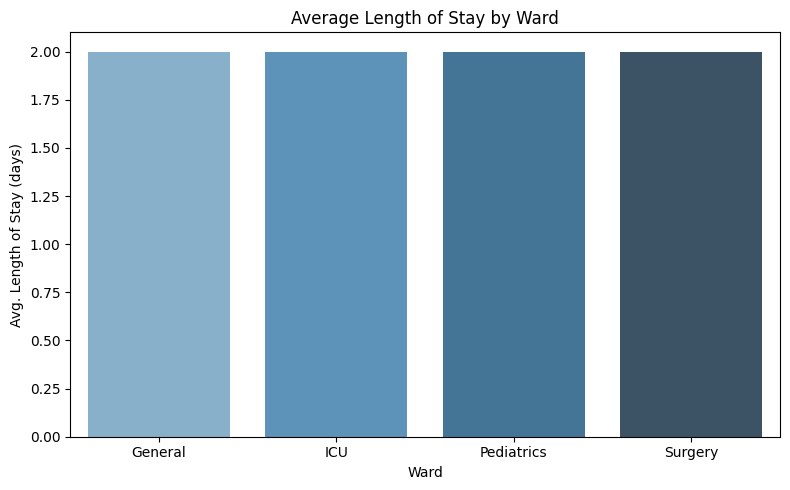

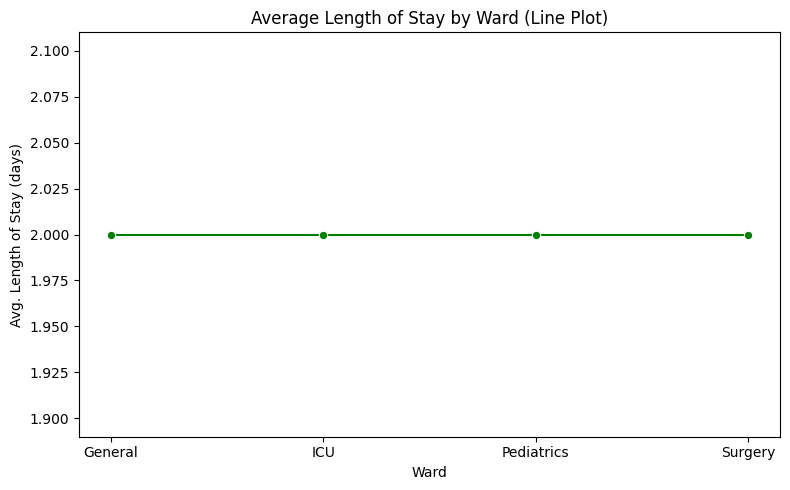

         ward  bed_days_used
0     General             92
1         ICU             92
2  Pediatrics            108
3     Surgery            108
         ward  bed_days_used  bed_occupancy_rate
0     General             92            0.851852
1         ICU             92            0.851852
2  Pediatrics            108            1.000000
3     Surgery            108            1.000000


<ipython-input-4-3765902213>:55: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='ward', y='bed_occupancy_rate', data=bed_occupancy, palette='Oranges_d')  # Create bar plot for occupancy rate


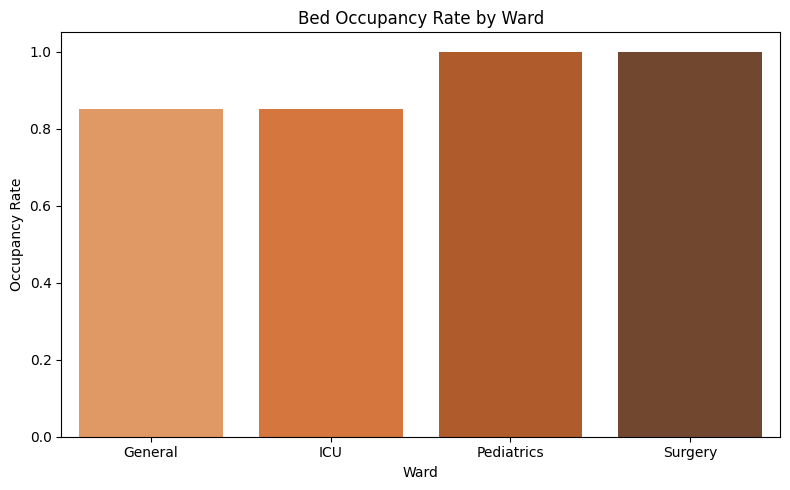

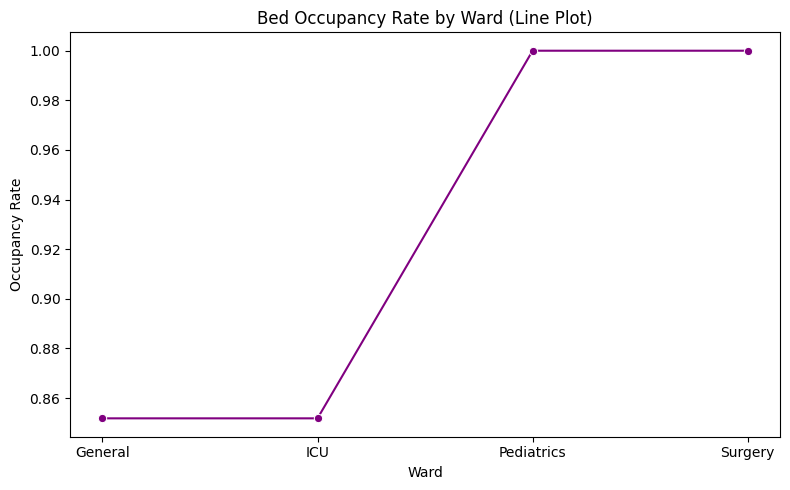

[{'date': Timestamp('2021-01-01 00:00:00'), 'ward': 'Surgery'}, {'date': Timestamp('2021-01-02 00:00:00'), 'ward': 'Surgery'}, {'date': Timestamp('2021-01-03 00:00:00'), 'ward': 'Surgery'}, {'date': Timestamp('2021-01-02 00:00:00'), 'ward': 'Pediatrics'}, {'date': Timestamp('2021-01-03 00:00:00'), 'ward': 'Pediatrics'}, {'date': Timestamp('2021-01-04 00:00:00'), 'ward': 'Pediatrics'}, {'date': Timestamp('2021-01-03 00:00:00'), 'ward': 'General'}, {'date': Timestamp('2021-01-04 00:00:00'), 'ward': 'General'}, {'date': Timestamp('2021-01-05 00:00:00'), 'ward': 'General'}, {'date': Timestamp('2021-01-04 00:00:00'), 'ward': 'Surgery'}, {'date': Timestamp('2021-01-05 00:00:00'), 'ward': 'Surgery'}, {'date': Timestamp('2021-01-06 00:00:00'), 'ward': 'Surgery'}, {'date': Timestamp('2021-01-05 00:00:00'), 'ward': 'Surgery'}, {'date': Timestamp('2021-01-06 00:00:00'), 'ward': 'Surgery'}, {'date': Timestamp('2021-01-07 00:00:00'), 'ward': 'Surgery'}, {'date': Timestamp('2021-01-06 00:00:00'), 'w

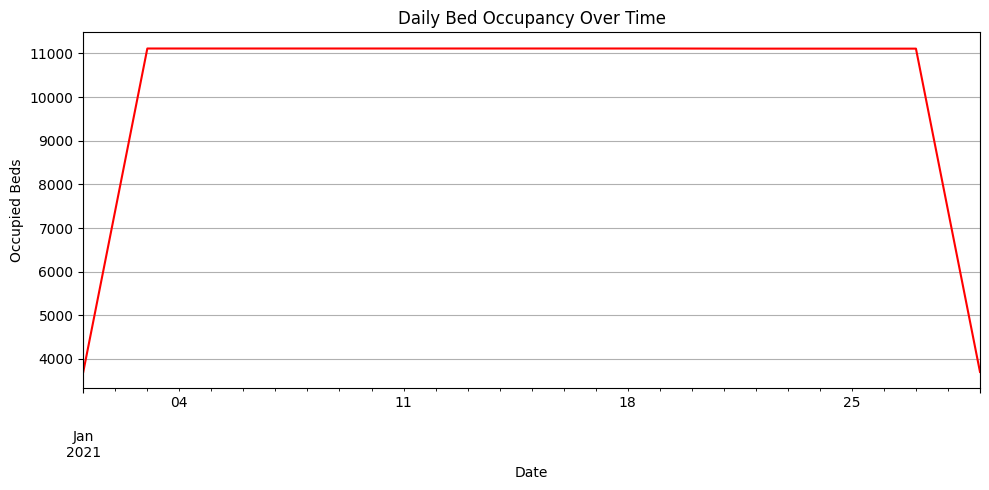

In [4]:
# Import required libraries
import pandas as pd  # Used for handling and manipulating tabular data
import matplotlib.pyplot as plt  # Used for creating static visualizations like bar/line charts
import seaborn as sns  # Provides high-level plotting functions and prettier plots
import numpy as np  # Used for numerical operations (though not directly used here)

# Load dataset
data = pd.read_csv('/content/hospital_datas.csv')  # Load hospital dataset from a CSV file into a DataFrame

# Convert date columns to datetime format
data['admission_date'] = pd.to_datetime(data['admission_date'])  # Convert admission_date column to datetime format
data['discharge_date'] = pd.to_datetime(data['discharge_date'])  # Convert discharge_date column to datetime format

# Calculate length of stay for each patient
data['length_of_stay'] = (data['discharge_date'] - data['admission_date']).dt.days  # Subtract admission from discharge to get stay length in days
print(data.head())

# Calculate average length of stay by ward
avg_stay = data.groupby('ward')['length_of_stay'].mean().reset_index()  # Group by ward and calculate mean stay length for each
print(avg_stay)

# Bar Plot – Average Length of Stay by Ward
plt.figure(figsize=(8, 5))  # Set figure size
sns.barplot(x='ward', y='length_of_stay', data=avg_stay, palette='Blues_d')  # Create bar plot of avg stay per ward
plt.title('Average Length of Stay by Ward')  # Add plot title
plt.xlabel('Ward')  # Label x-axis
plt.ylabel('Avg. Length of Stay (days)')  # Label y-axis
plt.tight_layout()  # Adjust layout to avoid clipping
plt.show()  # Display the plot

# Line Plot – Average Length of Stay by Ward
plt.figure(figsize=(8, 5))  # Set figure size
sns.lineplot(x='ward', y='length_of_stay', data=avg_stay, marker='o', color='green')  # Create line plot with points
plt.title('Average Length of Stay by Ward (Line Plot)')  # Add plot title
plt.xlabel('Ward')  # Label x-axis
plt.ylabel('Avg. Length of Stay (days)')  # Label y-axis
plt.tight_layout()  # Adjust layout
plt.show()  # Show the plot

# Calculate bed occupancy by ward
data['bed_days_used'] = data['length_of_stay']  # Create new column duplicating length_of_stay to represent beds used
bed_occupancy = data.groupby('ward')['bed_days_used'].sum().reset_index()  # Sum bed-days used per ward
print(bed_occupancy)

# Estimate total available beds (assumed max number of patients in any ward)
total_beds = data['ward'].value_counts().max()  # Use ward with max patient count as proxy for total beds
avg_los = data['length_of_stay'].mean()  # Calculate average length of stay overall

# Calculate bed occupancy rate
bed_occupancy['bed_occupancy_rate'] = bed_occupancy['bed_days_used'] / (total_beds * avg_los)  # Compute occupancy rate
print(bed_occupancy)

# Bar Plot – Bed Occupancy Rate by Ward
plt.figure(figsize=(8, 5))  # Set plot size
sns.barplot(x='ward', y='bed_occupancy_rate', data=bed_occupancy, palette='Oranges_d')  # Create bar plot for occupancy rate
plt.title('Bed Occupancy Rate by Ward')  # Add title
plt.xlabel('Ward')  # X-axis label
plt.ylabel('Occupancy Rate')  # Y-axis label
plt.tight_layout()  # Adjust layout
plt.show()  # Show plot

# Line Plot – Bed Occupancy Rate by Ward
plt.figure(figsize=(8, 5))  # Set figure size
sns.lineplot(x='ward', y='bed_occupancy_rate', data=bed_occupancy, marker='o', color='purple')  # Create line plot
plt.title('Bed Occupancy Rate by Ward (Line Plot)')  # Add title
plt.xlabel('Ward')  # Label x-axis
plt.ylabel('Occupancy Rate')  # Label y-axis
plt.tight_layout()  # Adjust layout
plt.show()  # Show the plot

# Daily Bed Occupancy – Generate daily records per patient
daily_records = []  # Create empty list to store daily stay entries
for _, row in data.iterrows():  # Iterate over each row in the dataset
    stay_dates = pd.date_range(start=row['admission_date'], end=row['discharge_date'])  # Generate all dates patient stayed
    for date in stay_dates:  # For each day patient stayed
        daily_records.append({'date': date, 'ward': row['ward']})  # Add record with date and ward
print(daily_records)

# Convert to DataFrame
daily_df = pd.DataFrame(daily_records)  # Convert list of dictionaries into DataFrame
print(daily_df)

# Group by date and count occupied beds
daily_occupancy = daily_df.groupby('date').size()  # Count number of occupied beds per date
print(daily_occupancy)

# Line Plot – Daily Bed Occupancy Over Time
plt.figure(figsize=(10, 5))  # Set plot size
daily_occupancy.plot(kind='line', color='red')  # Create line plot of daily bed counts
plt.title('Daily Bed Occupancy Over Time')  # Add title
plt.xlabel('Date')  # Label x-axis
plt.ylabel('Occupied Beds')  # Label y-axis
plt.grid(True)  # Add grid for better readability
plt.tight_layout()  # Adjust layout
plt.show()  # Show plot
